# Динамика двойного маятника (RK45 / RK4)
## Математическая модель

Рассмотрим маятник с параметрами: массы $m_1, m_2$, длины стержней $l_1, l_2$, ускорение свободного падения $g$.
Обобщённые координаты — углы отклонения от вертикали вниз: $\theta_1(t), \theta_2(t)$.

Вектор состояния:
$$
\mathbf{y} = (\theta_1,\ \theta_2,\ \omega_1,\ \omega_2)^{\mathsf T}, \qquad
\omega_1=\dot\theta_1,\ \omega_2=\dot\theta_2 .
$$

Уравнения движения в виде системы ОДУ первого порядка:
$$
\dot\theta_1=\omega_1,\quad \dot\theta_2=\omega_2,
$$
$$
\dot\omega_1 = f_1(\theta_1,\theta_2,\omega_1,\omega_2),\quad
\dot\omega_2 = f_2(\theta_1,\theta_2,\omega_1,\omega_2),
$$
где (стандартная форма, выводится из лагранжевой механики) при обозначении $\Delta = \theta_1-\theta_2$:

$$
\dot\omega_1=
\frac{
 -g(2m_1+m_2)\sin\theta_1
 -m_2 g\sin(\theta_1-2\theta_2)
 -2m_2\sin\Delta\big(\omega_2^2 l_2+\omega_1^2 l_1\cos\Delta\big)
}{
 l_1\big(2m_1+m_2-m_2\cos(2\Delta)\big)
},
$$

$$
\dot\omega_2=
\frac{
 2\sin\Delta\Big(\omega_1^2 l_1(m_1+m_2)
 +g(m_1+m_2)\cos\theta_1
 +\omega_2^2 l_2 m_2\cos\Delta\Big)
}{
 l_2\big(2m_1+m_2-m_2\cos(2\Delta)\big)
}.
$$

## Численные методы

### RK45 (адаптивный шаг)
`scipy.integrate.solve_ivp(..., method="RK45")`

### RK4 (фиксированный шаг)
Явная схема Рунге–Кутты 4-го порядка:
$$
y_{n+1}=y_n + \frac{h}{6}(k_1+2k_2+2k_3+k_4),
$$
$$
k_1=f(t_n,y_n),\quad
k_2=f\big(t_n+\tfrac h2,\ y_n+\tfrac h2 k_1\big),\quad
k_3=f\big(t_n+\tfrac h2,\ y_n+\tfrac h2 k_2\big),\quad
k_4=f(t_n+h,\ y_n+h k_3).
$$


In [1]:
import numpy as np
import matplotlib.pyplot as plt

from dataclasses import dataclass
from typing import Callable, Tuple

# Для RK45:
from scipy.integrate import solve_ivp

# Для анимации:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

plt.rcParams["figure.figsize"] = (10, 4)
plt.rcParams["axes.grid"] = True


## Параметры и вспомогательные функции

- Везде используем радианы.
- Для визуализации переводим в декартовы координаты:
$$
x_1=l_1\sin\theta_1,\quad y_1=-l_1\cos\theta_1,
$$
$$
x_2=x_1+l_2\sin\theta_2,\quad y_2=y_1-l_2\cos\theta_2.
$$


In [21]:
@dataclass
class PendulumParams:
    m1: float = 1.0
    m2: float = 1.0
    l1: float = 1.0
    l2: float = 1.0
    g: float = 9.81

def angles_to_xy(theta1: np.ndarray, theta2: np.ndarray, p: PendulumParams):
    x1 = p.l1 * np.sin(theta1)
    y1 = -p.l1 * np.cos(theta1)
    x2 = x1 + p.l2 * np.sin(theta2)
    y2 = y1 - p.l2 * np.cos(theta2)
    return x1, y1, x2, y2


## Правая часть ОДУ

Функция `double_pendulum_rhs(t, y, p)` возвращает $\dot{\mathbf y}$ для состояния
$\mathbf y=(\theta_1,\theta_2,\omega_1,\omega_2)$.


In [22]:
def double_pendulum_rhs(t: float, y: np.ndarray, p: PendulumParams) -> np.ndarray:
    theta1, theta2, w1, w2 = y
    m1, m2, l1, l2, g = p.m1, p.m2, p.l1, p.l2, p.g

    delta = theta1 - theta2

    denom = (2*m1 + m2 - m2*np.cos(2*delta))
    # защита от крайне редких численных проблем:
    if np.abs(denom) < 1e-12:
        denom = np.sign(denom) * 1e-12 if denom != 0 else 1e-12

    dw1 = (
        -g*(2*m1 + m2)*np.sin(theta1)
        - m2*g*np.sin(theta1 - 2*theta2)
        - 2*m2*np.sin(delta)*(w2**2*l2 + w1**2*l1*np.cos(delta))
    ) / (l1 * denom)

    dw2 = (
        2*np.sin(delta)*(
            w1**2*l1*(m1 + m2)
            + g*(m1 + m2)*np.cos(theta1)
            + w2**2*l2*m2*np.cos(delta)
        )
    ) / (l2 * denom)

    return np.array([w1, w2, dw1, dw2], dtype=float)


## Интеграторы: RK45 и RK4

Ниже две обёртки:

- `integrate_rk45(...)` — адаптивный шаг, высокая точность при разумной цене.
- `integrate_rk4(...)` — фиксированный шаг $h$, полезно для понимания алгоритма и контроля шага.


In [23]:
def integrate_rk45(
    y0: np.ndarray,
    t_span: Tuple[float, float],
    p: PendulumParams,
    t_eval: np.ndarray,
    rtol: float = 1e-9,
    atol: float = 1e-9,
):
    rhs = lambda t, y: double_pendulum_rhs(t, y, p)
    sol = solve_ivp(rhs, t_span, y0, method="RK45", t_eval=t_eval, rtol=rtol, atol=atol)
    if not sol.success:
        raise RuntimeError(sol.message)
    return sol.t, sol.y.T  # shape: (N,4)

def integrate_rk4(
    y0: np.ndarray,
    t_span: Tuple[float, float],
    p: PendulumParams,
    h: float,
):
    t0, t1 = t_span
    n = int(np.ceil((t1 - t0) / h)) + 1
    t = t0 + h*np.arange(n)
    t[-1] = t1

    y = np.zeros((n, 4), dtype=float)
    y[0] = y0

    for i in range(n-1):
        hi = t[i+1] - t[i]
        ti = t[i]
        yi = y[i]

        k1 = double_pendulum_rhs(ti, yi, p)
        k2 = double_pendulum_rhs(ti + 0.5*hi, yi + 0.5*hi*k1, p)
        k3 = double_pendulum_rhs(ti + 0.5*hi, yi + 0.5*hi*k2, p)
        k4 = double_pendulum_rhs(ti + hi, yi + hi*k3, p)

        y[i+1] = yi + (hi/6.0)*(k1 + 2*k2 + 2*k3 + k4)

    return t, y


## Пример расчёта при больших углах

Зададим большие начальные углы (типичный «хаотический» режим) и построим графики $\theta_1(t)$ и $\theta_2(t)$.


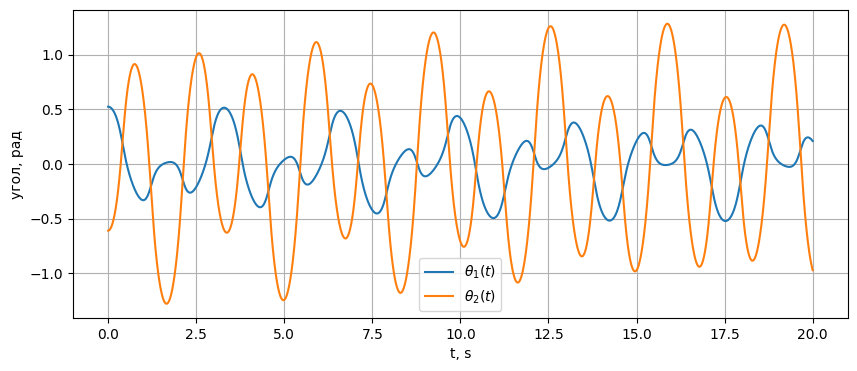

In [25]:
p = PendulumParams(m1=1.0, m2=1.0, l1=2.0, l2=1.0, g=9.81)

# Большие начальные углы:
theta1_0 = np.deg2rad(30)
theta2_0 = np.deg2rad(-35)
w1_0 = 0.0
w2_0 = 0.0

y0 = np.array([theta1_0, theta2_0, w1_0, w2_0], dtype=float)

t0, t1 = 0.0, 20.0
N = 4000
t_eval = np.linspace(t0, t1, N)

# Выберите метод:
use_rk45 = True

if use_rk45:
    t, Y = integrate_rk45(y0, (t0, t1), p, t_eval=t_eval, rtol=1e-9, atol=1e-9)
else:
    t, Y = integrate_rk4(y0, (t0, t1), p, h=(t1-t0)/(N-1))

theta1, theta2, w1, w2 = Y.T

fig, ax = plt.subplots()
ax.plot(t, theta1, label=r"$\theta_1(t)$")
ax.plot(t, theta2, label=r"$\theta_2(t)$")
ax.set_xlabel("t, s")
ax.set_ylabel("угол, рад")
ax.legend()
plt.show()


## Контроль качества: энергия

Для идеального двойного маятника (без трения) полная энергия должна сохраняться.
Ниже вычисляем:
- кинетическую энергию $T$ (через скорости масс),
- потенциальную энергию $V$ (относительно вертикали вниз),
- $E=T+V$.


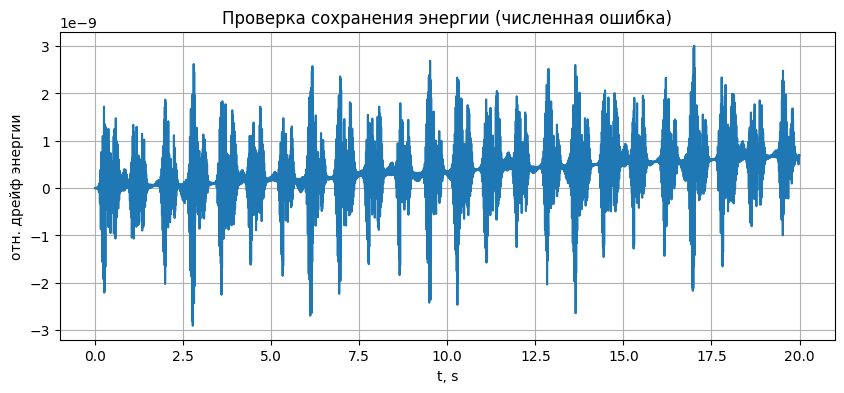

In [26]:
def total_energy(theta1, theta2, w1, w2, p: PendulumParams):
    m1, m2, l1, l2, g = p.m1, p.m2, p.l1, p.l2, p.g
    delta = theta1 - theta2

    # Скорости:
    v1_sq = (l1*w1)**2
    v2_sq = v1_sq + (l2*w2)**2 + 2*l1*l2*w1*w2*np.cos(delta)

    T = 0.5*m1*v1_sq + 0.5*m2*v2_sq
    V = -(m1+m2)*g*l1*np.cos(theta1) - m2*g*l2*np.cos(theta2)
    return T + V

E = total_energy(theta1, theta2, w1, w2, p)
E0 = E[0]
rel_drift = (E - E0) / (np.abs(E0) + 1e-12)

fig, ax = plt.subplots()
ax.plot(t, rel_drift)
ax.set_xlabel("t, s")
ax.set_ylabel("отн. дрейф энергии")
ax.set_title("Проверка сохранения энергии (численная ошибка)")
plt.show()


## Визуализация: анимация двойного маятника

Анимация строится по дискретным значениям $(x_1,y_1)$ и $(x_2,y_2)$.
Чтобы ускорить отрисовку, можно брать каждый $k$-й кадр.


In [27]:
# Координаты для анимации
x1, y1, x2, y2 = angles_to_xy(theta1, theta2, p)

# Ускоряем анимацию: берем каждый k-й кадр
k = 10
x1s, y1s, x2s, y2s = x1[::k], y1[::k], x2[::k], y2[::k]

fig, ax = plt.subplots(figsize=(5, 5))
L = p.l1 + p.l2
ax.set_xlim(-L-0.1, L+0.1)
ax.set_ylim(-L-0.1, L+0.1)
ax.set_aspect("equal")
ax.grid(True)

line1, = ax.plot([], [], lw=2)  # стержень 1
line2, = ax.plot([], [], lw=2)  # стержень 2
m1_point, = ax.plot([], [], marker="o", markersize=8)
m2_point, = ax.plot([], [], marker="o", markersize=8)
trace, = ax.plot([], [], lw=1, alpha=0.7)  # траектория m2

trace_len = 200  # длина хвоста

def init():
    line1.set_data([], [])
    line2.set_data([], [])
    m1_point.set_data([], [])
    m2_point.set_data([], [])
    trace.set_data([], [])
    return line1, line2, m1_point, m2_point, trace

def update(i):
    # стержень 1: (0,0)->(x1,y1)
    line1.set_data([0, x1s[i]], [0, y1s[i]])
    # стержень 2: (x1,y1)->(x2,y2)
    line2.set_data([x1s[i], x2s[i]], [y1s[i], y2s[i]])

    m1_point.set_data([x1s[i]], [y1s[i]])
    m2_point.set_data([x2s[i]], [y2s[i]])

    j0 = max(0, i-trace_len)
    trace.set_data(x2s[j0:i+1], y2s[j0:i+1])
    return line1, line2, m1_point, m2_point, trace

ani = FuncAnimation(fig, update, frames=len(x1s), init_func=init, interval=20, blit=True)
plt.close(fig)
HTML(ani.to_jshtml())


## Чувствительность к начальным условиям

Для хаотических режимов характерно быстрое расхождение близких траекторий.

Проведём два расчёта:
- базовое начальное условие $\mathbf y_0$,
- возмущённое $\mathbf y_0 + \delta$ (очень малое $\delta$ по одному из углов),

и посмотрим норму разности $\|\Delta\theta(t)\| = \sqrt{(\theta_1-\tilde\theta_1)^2+(\theta_2-\tilde\theta_2)^2}$.

Часто на начальном участке наблюдается приближённо экспоненциальный рост:
$$
\|\Delta\theta(t)\| \approx \|\Delta\theta(0)\|\,e^{\lambda t},
$$
где $\lambda$ — показатель Ляпунова (локальная оценка по наклону $\log$-графика).


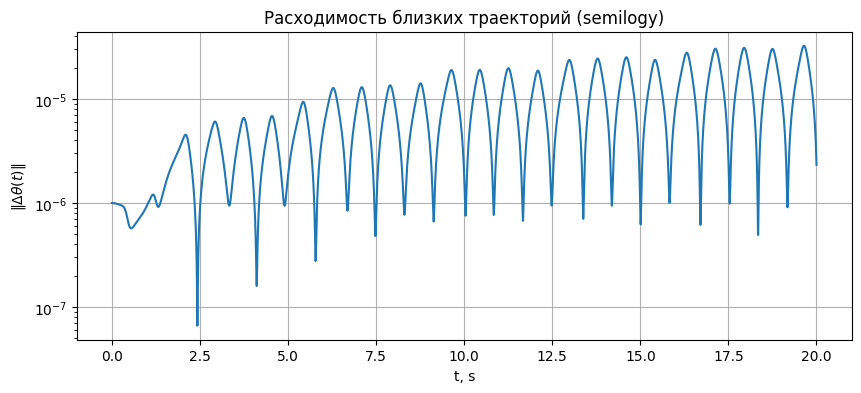

Локальная оценка λ ≈ 0.238 1/с (по t∈[0.5,6.0])


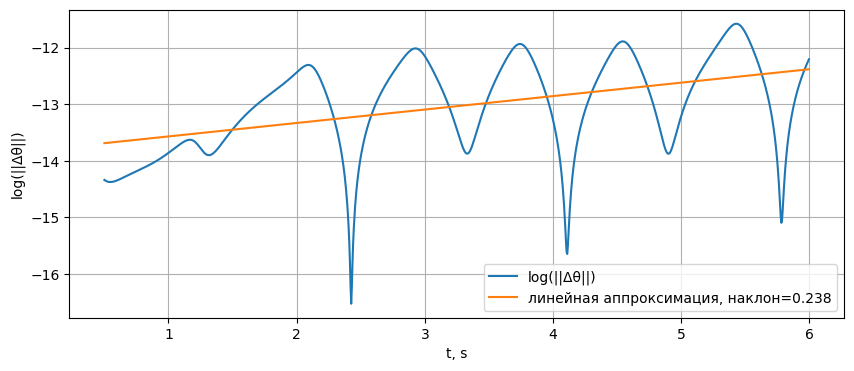

In [28]:
# Базовая траектория уже посчитана: t, Y

# Малое возмущение:
eps = 1e-6  # рад
y0_pert = y0.copy()
y0_pert[0] += eps  # возмущаем theta1(0)

if use_rk45:
    t2, Y2 = integrate_rk45(y0_pert, (t0, t1), p, t_eval=t_eval, rtol=1e-9, atol=1e-9)
else:
    t2, Y2 = integrate_rk4(y0_pert, (t0, t1), p, h=(t1-t0)/(N-1))

theta1b, theta2b = Y[:, 0], Y[:, 1]
theta1p, theta2p = Y2[:, 0], Y2[:, 1]

dtheta = np.sqrt((theta1b-theta1p)**2 + (theta2b-theta2p)**2)

fig, ax = plt.subplots()
ax.semilogy(t, dtheta)
ax.set_xlabel("t, s")
ax.set_ylabel(r"$\|\Delta\theta(t)\|$")
ax.set_title("Расходимость близких траекторий (semilogy)")
plt.show()

# Оценка локального показателя Ляпунова по начальному участку:
# берем участок, где dtheta не ушла в насыщение/потерю точности
mask = (t > 0.5) & (t < 6.0)
tt = t[mask]
yy = np.log(dtheta[mask] + 1e-30)

# линейная аппроксимация log(dtheta) ≈ a*t + b
a, b = np.polyfit(tt, yy, 1)
print(f"Локальная оценка λ ≈ {a:.3f} 1/с (по t∈[0.5,6.0])")

fig, ax = plt.subplots()
ax.plot(tt, yy, label="log(||Δθ||)")
ax.plot(tt, a*tt + b, label=f"линейная аппроксимация, наклон={a:.3f}")
ax.set_xlabel("t, s")
ax.set_ylabel("log(||Δθ||)")
ax.legend()
plt.show()
